## Case Study : Telecom Churn Case Study
### Akash Kodiganti
####May 2020


#### Problem Statement & Solution : 

<b> Problem: </b>
In the telecom industry, customers are able to choose from multiple service providers and actively <b>switch</b> from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, <b>customer retention</b> has now become even more important than customer acquisition.

<b>Action:</b> Predict which customers are at high risk of churn.

<b>Using:</b> Exploratory Data Analysis, Python Libraries, Machine Learning Models.

<b>Steps:</b>
1. Import Packages
2. Read and Understand given Data - The input CSV file is stored in AWS S3
3. Data Preparation

  3.1. Filter high value customers
  
  3.2. Remove columns having all zero values
  
  3.3. Remove columns having more percentage in number of zeros
  
  3.4. Imputing NaN with mean, mediam or mode for necessary columns
  
  3.5. Remove Outliers if found any by plotting graphs (histogram, boxplot)
  
  3.6. Derive any meaningful new features for further modelling
  
4. Model Building

  4.1. Split data in to Train and Test
  
  4.2. Feature Scaling & Churn rate

  4.3. Perform Principal Component Analysis (PCA) -  Remove unwanted columns
      
        4.3.1. Logistic Regression with PCA (Confusion Matrix, Accuracy, ROC)
        4.3.2. Decision Tree Modeling with PCA
        4.3.3. Random Forest Modeling with PCA (Viz. critical features)
        
5. Conclusion - Verify the Accuracy of different models, and take necessary Action based on extracted features. Possible action could be - Contact the customers periodically who are in the risk of churn based on these concluded features and provide special service schemes to retain the customers.

    



### Importing packages

In [111]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_rows = 4000

## Read and Understand data

In [112]:
#telecom_data = pd.read_csv(r'C:\Users\143483\Desktop\Final Case Study\telecom_churn_data.csv')
telecom_data = pd.read_csv('https://designworksakiiitb9.s3.amazonaws.com/telecom_churn_data.csv')
telecom_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [113]:
telecom_data.shape

(99999, 226)

In [114]:
telecom_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [115]:
telecom_data.isnull().any()

mobile_number               False
circle_id                   False
loc_og_t2o_mou               True
std_og_t2o_mou               True
loc_ic_t2o_mou               True
last_date_of_month_6        False
last_date_of_month_7         True
last_date_of_month_8         True
last_date_of_month_9         True
arpu_6                      False
arpu_7                      False
arpu_8                      False
arpu_9                      False
onnet_mou_6                  True
onnet_mou_7                  True
onnet_mou_8                  True
onnet_mou_9                  True
offnet_mou_6                 True
offnet_mou_7                 True
offnet_mou_8                 True
offnet_mou_9                 True
roam_ic_mou_6                True
roam_ic_mou_7                True
roam_ic_mou_8                True
roam_ic_mou_9                True
roam_og_mou_6                True
roam_og_mou_7                True
roam_og_mou_8                True
roam_og_mou_9                True
loc_og_t2t_mou

In [116]:
columns = telecom_data.columns
perc_null = round(100*(telecom_data.isnull().sum()/len(telecom_data.index)), 2)
print(perc_null)

mobile_number                0.00
circle_id                    0.00
loc_og_t2o_mou               1.02
std_og_t2o_mou               1.02
loc_ic_t2o_mou               1.02
last_date_of_month_6         0.00
last_date_of_month_7         0.60
last_date_of_month_8         1.10
last_date_of_month_9         1.66
arpu_6                       0.00
arpu_7                       0.00
arpu_8                       0.00
arpu_9                       0.00
onnet_mou_6                  3.94
onnet_mou_7                  3.86
onnet_mou_8                  5.38
onnet_mou_9                  7.75
offnet_mou_6                 3.94
offnet_mou_7                 3.86
offnet_mou_8                 5.38
offnet_mou_9                 7.75
roam_ic_mou_6                3.94
roam_ic_mou_7                3.86
roam_ic_mou_8                5.38
roam_ic_mou_9                7.75
roam_og_mou_6                3.94
roam_og_mou_7                3.86
roam_og_mou_8                5.38
roam_og_mou_9                7.75
loc_og_t2t_mou

In [117]:
# Get the name of columns having more than 70% null values
null_df = pd.DataFrame({'column_name': columns ,
                         'perc_missing': perc_null})
miss_drop = list(null_df[null_df.perc_missing>40.00].column_name)
print(miss_drop)

['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9']


In [118]:
# Drop the columns having more than 40% of null values.
#telecom_data = telecom_data.drop(['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9'],axis=1)

In [119]:
# Drop Duplicates if any
telecom_data=telecom_data.drop_duplicates()

In [120]:
telecom_data.shape

(99999, 226)

In [121]:
# Remove if any duplicate rows including the mobilenumber field
telecom_data.drop_duplicates(keep=False,inplace=True) 

In [122]:
telecom_data.shape

(99999, 226)

There are no duplicate rows

In [123]:
# Percentiles
telecom_data.describe(percentiles = [0.05,.10,.25,.50,.75,.90,.95,.99])

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [124]:
telecom_data['total_rech_data_6'].fillna(0, inplace=True)
telecom_data['av_rech_amt_data_6'].fillna(0, inplace=True)

telecom_data['total_rech_data_7'].fillna(0, inplace=True)
telecom_data['av_rech_amt_data_7'].fillna(0, inplace=True)

# Month 8
telecom_data['total_rech_data_8'].fillna(0, inplace=True)
telecom_data['av_rech_amt_data_8'].fillna(0, inplace=True)

In [125]:
(telecom_data.isnull().sum(axis = 0)/ len(telecom_data)) * 100

mobile_number                0.000000
circle_id                    0.000000
loc_og_t2o_mou               1.018010
std_og_t2o_mou               1.018010
loc_ic_t2o_mou               1.018010
last_date_of_month_6         0.000000
last_date_of_month_7         0.601006
last_date_of_month_8         1.100011
last_date_of_month_9         1.659017
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
arpu_9                       0.000000
onnet_mou_6                  3.937039
onnet_mou_7                  3.859039
onnet_mou_8                  5.378054
onnet_mou_9                  7.745077
offnet_mou_6                 3.937039
offnet_mou_7                 3.859039
offnet_mou_8                 5.378054
offnet_mou_9                 7.745077
roam_ic_mou_6                3.937039
roam_ic_mou_7                3.859039
roam_ic_mou_8                5.378054
roam_ic_mou_9                7.745077
roam_og_mou_6                3.937039
roam_og_mou_

In [126]:
# Get the name of columns having more than 70% null values
null_df = pd.DataFrame({'column_name': columns ,
                         'perc_missing': perc_null})
miss_drop = list(null_df[null_df.perc_missing>40.00].column_name)
print(miss_drop)

['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9']


In [127]:
# No:of columns with more than 70% missing values 
print(len(miss_drop))

40


In [128]:
#Remove the columns having 70% above missing values
telecom_data = telecom_data.drop(miss_drop, axis=1)
telecom_data.shape

(99999, 186)

## Data Preparation

### Filter high-value customers

We need to predict churn only for the high-value customers.
Define high-value customers as follows: Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

In [129]:
avg_rech_amt_months_6_7 = telecom_data[['total_rech_amt_6',
                                             'total_rech_amt_7']].mean(axis = 1)

amt_70th_percentile = np.percentile(avg_rech_amt_months_6_7 , 70)

print("70th percentile reacharge amt for months 6&7 - ", amt_70th_percentile)

70th percentile reacharge amt for months 6&7 -  368.5


In [130]:
# Filtering high values

telecom_data = telecom_data[avg_rech_amt_months_6_7 >= amt_70th_percentile]

In [131]:
telecom_data.shape

(30011, 186)

<b>After filtering high value customers , we have only 30011 record, moving ahead to Derive Churn</b>

In [132]:
# To derive target variable or y (using 9th month data)
telecom_data['Churn'] = telecom_data['total_rech_amt_9'].apply(lambda x: '1' if x==0  else '0')
telecom_data['Churn']

7        1
8        0
13       0
16       0
17       0
        ..
99970    0
99974    0
99986    0
99988    0
99997    0
Name: Churn, Length: 30011, dtype: object

In [133]:
telecom_data.shape

(30011, 187)

In [134]:
#removing all columns corresponding to month 9 (using suffix)
telecom_data = telecom_data.loc[:, ~telecom_data.columns.str.endswith('_9')]
telecom_data.shape

(30011, 143)

In [135]:
telecom_data.head

<bound method NDFrame.head of        mobile_number  circle_id  loc_og_t2o_mou  std_og_t2o_mou  \
7         7000701601        109             0.0             0.0   
8         7001524846        109             0.0             0.0   
13        7002191713        109             0.0             0.0   
16        7000875565        109             0.0             0.0   
17        7000187447        109             0.0             0.0   
...              ...        ...             ...             ...   
99970     7001386760        109             0.0             0.0   
99974     7001453306        109             0.0             0.0   
99986     7001729035        109             0.0             0.0   
99988     7002111859        109             0.0             0.0   
99997     7000498689        109             0.0             0.0   

       loc_ic_t2o_mou last_date_of_month_6 last_date_of_month_7  \
7                 0.0            6/30/2014            7/31/2014   
8                 0.0          

<b>Columns are reduced to 143 with 30k rows after removing all columns having suffix 9 and deriving the Churn or y variable</b>

In [136]:
#Performing little more EDA

#1. Remove columns having all zero values
#2. Remove columns having more percentage in number of zeros (same like null value % calculation)
#(3. Since there are no categorical values, no action required at categorical side)
#3. Imputing NaN with mean mediam or mode for necessary columns
#4. Remove Outliers if found any by plotting graphs (histogram, boxplot)
#5. Derive any meaningful newe features for further modelling
#6. Perform PCA to minimise the number of columns (remove unwanted columns)

##### 1.Remove columns having all zero values

In [137]:
zero_cols = telecom_data.columns[(telecom_data == 0).sum() > 1.0*telecom_data.shape[1]]
print(zero_cols)


Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6',
       ...
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object', length=131)


In [138]:
telecom_data = telecom_data.T[telecom_data.any()].T

In [139]:
telecom_data.shape

(30011, 134)

In [140]:
telecom_data.head

<bound method NDFrame.head of       mobile_number circle_id last_date_of_month_6 last_date_of_month_7  \
7        7000701601       109            6/30/2014            7/31/2014   
8        7001524846       109            6/30/2014            7/31/2014   
13       7002191713       109            6/30/2014            7/31/2014   
16       7000875565       109            6/30/2014            7/31/2014   
17       7000187447       109            6/30/2014            7/31/2014   
...             ...       ...                  ...                  ...   
99970    7001386760       109            6/30/2014            7/31/2014   
99974    7001453306       109            6/30/2014            7/31/2014   
99986    7001729035       109            6/30/2014            7/31/2014   
99988    7002111859       109            6/30/2014            7/31/2014   
99997    7000498689       109            6/30/2014            7/31/2014   

      last_date_of_month_8   arpu_6   arpu_7   arpu_8 onnet_mou_6 onn

 Removed 9 columns with only zeroes

#### 2. Remove columns where the percentage of zeroes is more than 70%

In [141]:
telecom_data = telecom_data.loc[:, (telecom_data==0).mean() < .7]
telecom_data.head

<bound method NDFrame.head of       mobile_number circle_id last_date_of_month_6 last_date_of_month_7  \
7        7000701601       109            6/30/2014            7/31/2014   
8        7001524846       109            6/30/2014            7/31/2014   
13       7002191713       109            6/30/2014            7/31/2014   
16       7000875565       109            6/30/2014            7/31/2014   
17       7000187447       109            6/30/2014            7/31/2014   
...             ...       ...                  ...                  ...   
99970    7001386760       109            6/30/2014            7/31/2014   
99974    7001453306       109            6/30/2014            7/31/2014   
99986    7001729035       109            6/30/2014            7/31/2014   
99988    7002111859       109            6/30/2014            7/31/2014   
99997    7000498689       109            6/30/2014            7/31/2014   

      last_date_of_month_8   arpu_6   arpu_7   arpu_8 onnet_mou_6 onn

In [142]:
telecom_data.shape

(30011, 85)

In [143]:
telecom_data.columns

Index(['mobile_number', 'circle_id', 'last_date_of_month_6',
       'last_date_of_month_7', 'last_date_of_month_8', 'arpu_6', 'arpu_7',
       'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'spl_og_mou_6',
       'spl_og_mou_7', 'spl_og_mou_8', 'total_og_mou_6', 'total_og_mou_7',
       'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7',
       'loc_ic_t2f_

In [144]:
#Dropping columns last_date_of_month_6, _7, and _8 since it is same in all the rows except for the month
telecom_data = telecom_data.drop(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8'], axis=1)

In [145]:
telecom_data.head()

,mobile_number,circle_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,aon,Churn
7,7000701601,109,1069.18,1349.85,3171.48,57.84,54.68,52.29,453.43,567.16,325.91,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,422.16,533.91,255.79,4.3,23.29,12.01,49.89,31.76,49.14,60.86,75.14,77.84,4.5,0.0,6.5,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,180.54,173.08,193.94,626.46,558.04,428.74,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.0,802,1
8,7001524846,109,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,297.13,217.59,12.49,80.96,70.58,50.54,0.0,0.0,0.0,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,130.26,143.48,98.28,0.0,0.0,10.23,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.0,0.0,0.0,81.43,23.83,15.79,0.0,0.58,0.1,22.43,4.08,0.65,22.43,4.66,0.75,103.86,28.49,16.54,19,21,14,437,601,120,90,154,30,6/25/2014,7/31/2014,8/30/2014,50,0,10,0.0,356.0,0.03,315,0
13,7002191713,109,492.846,205.671,593.26,501.76,108.39,534.24,413.31,119.28,482.46,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.0,23.51,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,701.78,138.93,655.18,0.0,0.0,4.78,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.0,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,423.81,68.09,474.41,968.61,172.58,1144.53,6,4,11,507,253,717,110,110,130,6/20/2014,7/22/2014,8/30/2014,110,50,0,0.0,0.0,0.02,2607,0
16,7000875565,109,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,42.61,65.16,67.38,273.29,145.99,128.28,0.0,4.48,10.26,315.91,215.64,205.93,7.89,2.58,3.23,22.99,64.51,18.29,30.89,67.09,21.53,0.0,3.26,5.91,346.81,286.01,233.38,41.33,71.44,28.89,226.81,149.69,150.16,8.71,8.68,32.71,276.86,229.83,211.78,68.79,78.64,6.33,18.68,73.08,73.93,87.99,151.73,82.44,364.86,381.56,294.46,10,6,2,570,348,160,110,110,130,6/30/2014,7/31/2014,8/14/2014,100,100,130,0.0,0.0,0.0,511,0
17,7000187447,109,690.008,18.98,25.499,1185.91,9.28,7.79,61.64,0.0,5.54,38.99,0.0,0.0,58.54,0.0,0.0,0.0,0.0,0.0,97.54,0.0,0.0,1146.91,0.81,0.0,1.55,0.0,0.0,1148.46,0.81,0.0,2.58,0.0,0.0,1249.53,0.81,0.0,34.54,0.0,0.0,47.41,2.31,0.0,0.0,0.0,0.0,81.96,2.31,0.0,8.63,0.0,0.0,1.28,0.0,0.0,9.91,0.0,0.0,91.88,2.31,0.0,19,2,4,816,0,30,110,0,30,6/30/2014,7/30/2014,8/25/2014,30,0,0,0.0,0.0,0.0,667,0


#### 3.Imputing coloumn values with mean, median or mode for necessary fields

In [146]:
mou_cols = telecom_data.loc[:, telecom_data.columns.str.contains('mou')]
mou_cols.columns

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'spl_og_mou_6',
       'spl_og_mou_7', 'spl_og_mou_8', 'total_og_mou_6', 'total_og_mou_7',
       'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8',
       'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8',
       'std_ic_t2m_mou_

In [147]:
pd.set_option('display.max_columns', None)
telecom_data.head(30)
#found NaN values in the below list

,mobile_number,circle_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,aon,Churn
7,7000701601,109,1069.18,1349.85,3171.48,57.84,54.68,52.29,453.43,567.16,325.91,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,422.16,533.91,255.79,4.3,23.29,12.01,49.89,31.76,49.14,60.86,75.14,77.84,4.5,0.0,6.5,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,180.54,173.08,193.94,626.46,558.04,428.74,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.0,802,1
8,7001524846,109,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,297.13,217.59,12.49,80.96,70.58,50.54,0.0,0.0,0.0,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,130.26,143.48,98.28,0.0,0.0,10.23,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.0,0.0,0.0,81.43,23.83,15.79,0.0,0.58,0.1,22.43,4.08,0.65,22.43,4.66,0.75,103.86,28.49,16.54,19,21,14,437,601,120,90,154,30,6/25/2014,7/31/2014,8/30/2014,50,0,10,0.0,356.0,0.03,315,0
13,7002191713,109,492.846,205.671,593.26,501.76,108.39,534.24,413.31,119.28,482.46,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.0,23.51,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,701.78,138.93,655.18,0.0,0.0,4.78,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.0,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,423.81,68.09,474.41,968.61,172.58,1144.53,6,4,11,507,253,717,110,110,130,6/20/2014,7/22/2014,8/30/2014,110,50,0,0.0,0.0,0.02,2607,0
16,7000875565,109,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,42.61,65.16,67.38,273.29,145.99,128.28,0.0,4.48,10.26,315.91,215.64,205.93,7.89,2.58,3.23,22.99,64.51,18.29,30.89,67.09,21.53,0.0,3.26,5.91,346.81,286.01,233.38,41.33,71.44,28.89,226.81,149.69,150.16,8.71,8.68,32.71,276.86,229.83,211.78,68.79,78.64,6.33,18.68,73.08,73.93,87.99,151.73,82.44,364.86,381.56,294.46,10,6,2,570,348,160,110,110,130,6/30/2014,7/31/2014,8/14/2014,100,100,130,0.0,0.0,0.0,511,0
17,7000187447,109,690.008,18.98,25.499,1185.91,9.28,7.79,61.64,0.0,5.54,38.99,0.0,0.0,58.54,0.0,0.0,0.0,0.0,0.0,97.54,0.0,0.0,1146.91,0.81,0.0,1.55,0.0,0.0,1148.46,0.81,0.0,2.58,0.0,0.0,1249.53,0.81,0.0,34.54,0.0,0.0,47.41,2.31,0.0,0.0,0.0,0.0,81.96,2.31,0.0,8.63,0.0,0.0,1.28,0.0,0.0,9.91,0.0,0.0,91.88,2.31,0.0,19,2,4,816,0,30,110,0,30,6/30/2014,7/30/2014,8/25/2014,30,0,0,0.0,0.0,0.0,667,0
21,7002124215,109,514.453,597.753,637.76,102.41,132.11,85.14,757.93,896.68,983.39,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.0,1.58,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,763.29,934.69,938.79,0.0,0.0,0.0,860.34,1028.79,1068.54,2.48,10.19,19.54,118.23,74.63,129.16,4.61,2.84,10.39,125.33,87.68,159.11,14.06,5.98,0.18,67.69,38.23,101.74,81.76,44.21,101.93,207.09,131.89,261.04,22,26,27,600,680,718,50,50,50,6/30/2014,7/31/2014,8/31/

In [148]:
#checking for one column:
telecom_data['offnet_mou_7'] = telecom_data['offnet_mou_7'].fillna(telecom_data['offnet_mou_7'].mean())
telecom_data.head

<bound method NDFrame.head of       mobile_number circle_id   arpu_6   arpu_7   arpu_8 onnet_mou_6  \
7        7000701601       109  1069.18  1349.85  3171.48       57.84   
8        7001524846       109  378.721  492.223  137.362      413.69   
13       7002191713       109  492.846  205.671   593.26      501.76   
16       7000875565       109  430.975  299.869  187.894       50.51   
17       7000187447       109  690.008    18.98   25.499     1185.91   
...             ...       ...      ...      ...      ...         ...   
99970    7001386760       109  261.269  410.614  290.851        5.01   
99974    7001453306       109  414.303  321.093  371.016       17.56   
99986    7001729035       109  644.973  455.228  564.334      806.73   
99988    7002111859       109  312.558  512.932   402.08      199.89   
99997    7000498689       109  322.991  303.386  606.817         0.0   

      onnet_mou_7 onnet_mou_8 offnet_mou_6  offnet_mou_7 offnet_mou_8  \
7           54.68       52.29   

In [149]:
#for loop for mou columns (Minutes of usage - voice calls)
for i in mou_cols.columns:
    telecom_data[i] = telecom_data[i].fillna(telecom_data[i].mean())
telecom_data.head

<bound method NDFrame.head of       mobile_number circle_id   arpu_6   arpu_7   arpu_8  onnet_mou_6  \
7        7000701601       109  1069.18  1349.85  3171.48        57.84   
8        7001524846       109  378.721  492.223  137.362       413.69   
13       7002191713       109  492.846  205.671   593.26       501.76   
16       7000875565       109  430.975  299.869  187.894        50.51   
17       7000187447       109  690.008    18.98   25.499      1185.91   
...             ...       ...      ...      ...      ...          ...   
99970    7001386760       109  261.269  410.614  290.851         5.01   
99974    7001453306       109  414.303  321.093  371.016        17.56   
99986    7001729035       109  644.973  455.228  564.334       806.73   
99988    7002111859       109  312.558  512.932   402.08       199.89   
99997    7000498689       109  322.991  303.386  606.817         0.00   

       onnet_mou_7  onnet_mou_8  offnet_mou_6  offnet_mou_7  offnet_mou_8  \
7            54.

#### 4. Outlier treatment - Bar graph and boxplot

In [150]:
pd.set_option('display.max_columns', None)
telecom_data.describe(percentiles = [0.05,.10,.25,.50,.75,.90,.95,.99])

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,299.184718,307.447285,276.234168,422.380819,428.248096,387.121245,95.688242,96.706103,89.951446,183.208674,183.120362,172.998297,7.053601,7.169655,6.703844,285.959416,287.005181,269.662288,191.772393,201.916113,177.752086,205.259036,215.588560,185.362328,399.067969,419.564032,364.965911,5.979323,7.501222,7.107334,686.697541,709.124730,623.774684,69.480649,71.028476,68.064333,161.312344,162.453208,158.585128,15.76159,16.678413,15.180997,246.564535,250.170194,241.840347,16.402055,17.066026,15.537177,32.355853,33.818592,31.416700,51.667018,53.912174,49.725160,307.512073,314.875472,295.426531
std,459.762472,480.799024,464.078274,468.609449,484.637914,472.713823,236.647789,247.944203,234.199466,249.432023,240.024982,232.925238,22.654082,22.577489,20.186350,378.862512,374.740417,363.523203,409.248843,427.643310,408.865690,412.958095,437.411218,415.502769,605.139246,636.065171,612.938412,18.611368,23.053549,22.859984,660.356820,685.071178,685.983313,158.488559,167.165202,155.251216,221.389570,218.830148,215.264800,45.79876,49.450268,43.634171,311.791476,314.475367,304.146273,78.844585,84.674215,72.382629,101.030998,105.752574,105.166905,140.405093,149.082042,140.699389,361.159561,369.654489,360.343153
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5%,3.855000,3.745000,1.010000,28.180000,28.715000,10.310000,0.000000,0.000000,0.000000,1.400000,2.160000,0.000000,0.000000,0.000000,0.000000,3.635000,4.820000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.525000,26.585000,0.000000,0.000000,0.000000,0.000000,2.330000,3.800000,0.580000,0.00000,0.000000,0.000000,5.910000,8.835000,1.805000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.030000,13.460000,0.000000
10%,12.210000,11.690000,6.880000,58.590000,59.580000,35.080000,1.190000,1.460000,0.400000,7.610000,9.080000,3.990000,0.000000,0

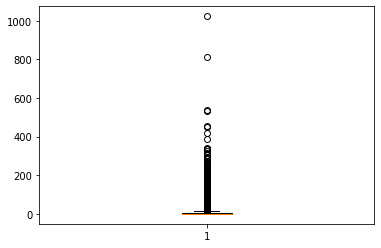

In [151]:
#checking for one random column - spl_og_mou_6
plt.boxplot(telecom_data["spl_og_mou_6"])
plt.show()

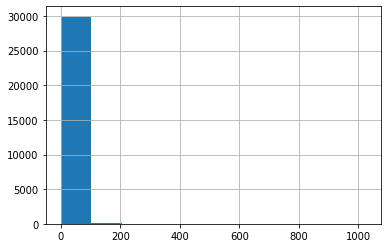

In [152]:
#checking for one random column - spl_og_mou_6
telecom_data["spl_og_mou_6"].hist()
plt.show()

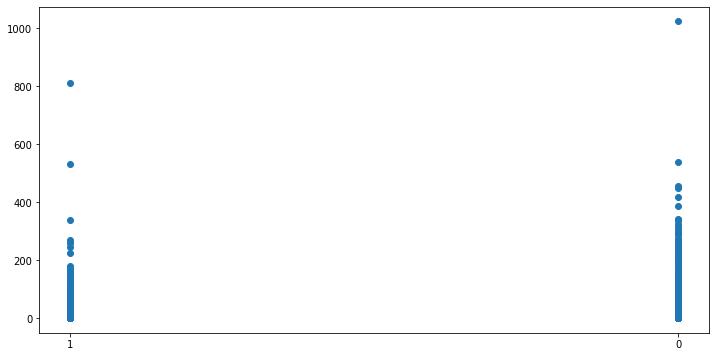

In [153]:
fig, ax = plt.subplots(figsize=(12,6))
ax.scatter(telecom_data['Churn'],telecom_data["spl_og_mou_6"])
plt.show()

In [154]:

# for i in telecom_data.columns:
#     plt.boxplot(telecom_data[i])
#     plt.title(i)
#     plt.show()

In [155]:
# for i in telecom_data.columns:
#     telecom_data[i].hist()
#     plt.title(i)
#     plt.show()

In [156]:
telecom_data.columns

Index(['mobile_number', 'circle_id', 'arpu_6', 'arpu_7', 'arpu_8',
       'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'spl_og_mou_6',
       'spl_og_mou_7', 'spl_og_mou_8', 'total_og_mou_6', 'total_og_mou_7',
       'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8',
       'std_ic_t2t_mou_

In [157]:
telecom_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30011 entries, 7 to 99997
Data columns (total 82 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mobile_number        30011 non-null  object 
 1   circle_id            30011 non-null  object 
 2   arpu_6               30011 non-null  object 
 3   arpu_7               30011 non-null  object 
 4   arpu_8               30011 non-null  object 
 5   onnet_mou_6          30011 non-null  float64
 6   onnet_mou_7          30011 non-null  float64
 7   onnet_mou_8          30011 non-null  float64
 8   offnet_mou_6         30011 non-null  float64
 9   offnet_mou_7         30011 non-null  float64
 10  offnet_mou_8         30011 non-null  float64
 11  loc_og_t2t_mou_6     30011 non-null  float64
 12  loc_og_t2t_mou_7     30011 non-null  float64
 13  loc_og_t2t_mou_8     30011 non-null  float64
 14  loc_og_t2m_mou_6     30011 non-null  float64
 15  loc_og_t2m_mou_7     30011 non-null 

In [158]:
telecom_data[['total_rech_num_6','total_rech_num_8','total_rech_amt_8','max_rech_amt_6','max_rech_amt_7','vol_2g_mb_8','aon']] = telecom_data[['total_rech_num_6','total_rech_num_8','total_rech_amt_8','max_rech_amt_6','max_rech_amt_7','vol_2g_mb_8','aon']].apply(pd.to_numeric)

#### Removing the Outliers

In [159]:
telecom_data.dtypes

mobile_number           object
circle_id               object
arpu_6                  object
arpu_7                  object
arpu_8                  object
onnet_mou_6            float64
onnet_mou_7            float64
onnet_mou_8            float64
offnet_mou_6           float64
offnet_mou_7           float64
offnet_mou_8           float64
loc_og_t2t_mou_6       float64
loc_og_t2t_mou_7       float64
loc_og_t2t_mou_8       float64
loc_og_t2m_mou_6       float64
loc_og_t2m_mou_7       float64
loc_og_t2m_mou_8       float64
loc_og_t2f_mou_6       float64
loc_og_t2f_mou_7       float64
loc_og_t2f_mou_8       float64
loc_og_mou_6           float64
loc_og_mou_7           float64
loc_og_mou_8           float64
std_og_t2t_mou_6       float64
std_og_t2t_mou_7       float64
std_og_t2t_mou_8       float64
std_og_t2m_mou_6       float64
std_og_t2m_mou_7       float64
std_og_t2m_mou_8       float64
std_og_mou_6           float64
std_og_mou_7           float64
std_og_mou_8           float64
spl_og_m

In [160]:
# Removed the outliers by imputing 1 or 99th percentile for all numeric columns
all_cols = telecom_data.select_dtypes([np.number]).columns

for col in all_cols:
    percentiles = telecom_data[col].quantile([0.01,0.99]).values
    telecom_data[col][telecom_data[col] <= percentiles[0]] = percentiles[0]
    telecom_data[col][telecom_data[col] >= percentiles[1]] = percentiles[1]

In [161]:
# After removing the outliers check the percentiles
telecom_data.describe(percentiles = [0.05,.10,.25,.50,.75,.90,.95,.99])


,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_rech_num_6,total_rech_num_8,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,vol_2g_mb_8,aon
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,290.508038,298.149154,266.963073,414.590962,419.666680,377.177972,87.613784,87.539292,81.478069,177.727988,178.308732,168.532677,6.357385,6.471694,6.099371,278.375337,279.003926,262.524660,183.956762,193.636694,169.577257,197.126511,207.065450,175.563373,389.887482,409.761301,354.243746,5.376924,6.696894,6.240155,677.225921,698.375059,612.912128,63.589408,64.551672,62.030278,155.989240,157.049969,153.405612,14.286103,15.043713,13.736537,240.018532,243.398554,235.599036,13.119384,13.818227,12.621626,28.551225,29.633179,27.321571,46.648243,48.729298,44.540947,300.713796,307.67722,288.705770,11.983539,10.091233,600.722898,168.844924,172.585252,61.649530,1263.367832
std,403.886845,418.761932,397.469031,419.595173,428.779544,400.328098,159.774671,157.823017,143.896586,212.726152,208.235901,203.519791,14.586697,14.684591,13.877245,326.663771,319.500616,309.606555,356.292504,371.162469,350.255307,357.689668,377.331138,334.595313,552.959581,578.372259,542.802365,11.501562,13.288367,12.221740,607.538523,624.347960,617.822721,97.996971,99.457496,95.501505,182.823534,179.463778,176.641395,31.176385,32.757430,29.204408,267.657306,267.887870,262.169060,31.948862,33.700569,31.379401,58.717164,60.852797,56.145847,88.341619,92.859260,85.444994,317.080828,321.62943,316.557966,8.625277,8.709144,448.392226,151.362309,155.453901,193.316945,973.221741
min,0.000000,0.000000,0.000000,1.062000,1.112000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,189.000000
5%,3.855000,3.745000,1.010000,28.180000,28.715000,10.310000,0.000000,0.000000,0.000000,1.400000,2.160000,0.000000,0.000000,0.000000,0.000000,3.635000,4.820000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

### Derive new features

In [162]:
# Creating a tenure column

# Convert column aon to numeric
telecom_data['aon'] = telecom_data['aon'].astype(str).astype(int)
telecom_data['tenure'] = np.round(telecom_data['aon'] / 365, 0)
telecom_data.head()

,mobile_number,circle_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,aon,Churn,tenure
7,7000701601,109,1069.18,1349.85,3171.48,57.84,54.68,52.29,453.43,567.160,325.91,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,60.86,75.14,77.84,4.50,0.00,6.50,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,180.54,173.08,193.94,626.46,558.04,428.74,5,5,7,1580,790,2341.9,1000,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.00,802,1,2.0
8,7001524846,109,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.630,136.48,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,130.26,143.48,98.28,0.00,0.00,10.23,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,22.43,4.66,0.75,103.86,28.49,16.54,19,21,14,437,601,120.0,90,154,30,6/25/2014,7/31/2014,8/30/2014,50,0,10,0.0,356.0,0.03,315,0,1.0
13,7002191713,109,492.846,205.671,593.26,501.76,108.39,534.24,413.31,119.280,482.46,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,701.78,138.93,655.18,0.00,0.00,4.78,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,423.81,68.09,474.41,968.61,172.58,1144.53,6,4,11,507,253,717.0,110,110,130,6/20/2014,7/22/2014,8/30/2014,110,50,0,0.0,0.0,0.02,2607,0,7.0
16,7000875565,109,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.740,162.76,42.61,65.16,67.38,273.29,145.99,128.28,0.00,4.48,10.26,315.91,215.64,205.93,7.89,2.58,3.23,22.99,64.51,18.29,30.89,67.09,21.53,0.00,3.26,5.91,346.81,286.01,233.38,41.33,71.44,28.89,226.81,149.69,150.16,8.71,8.68,32.71,276.86,229.83,211.78,68.79,78.64,6.33,18.68,73.08,73.93,87.99,151.73,82.44,364.86,381.56,294.46,10,6,2,570,348,160.0,110,110,130,6/30/2014,7/31/2014,8/14/2014,100,100,130,0.0,0.0,0.00,511,0,1.0
17,7000187447,109,690.008,18.98,25.499,1185.91,9.28,7.79,61.64,1.112,5.54,38.99,0.00,0.00,58.54,0.00,0.00,0.00,0.00,0.00,97.54,0.00,0.00,1146.91,0.81,0.00,1.55,0.00,0.00,1148.46,0.81,0.00,2.58,0.00,0.00,1249.53,0.81,0.00,34.54,0.00,0.00,47.41,2.31,0.00,0.00,0.00,0.00,81.96,2.31,0.00,8.63,0.00,0.00,1.28,0.00,0.00,9.91,0.00,0.00,91.88,2.31,0.00,19,2,4,816,0,30.0,110,0,30,6/30/2014,7/30/2014,8/25/2014,30,0,0,0.0,0.0,0.00,667,0,2.0


In [163]:
# Remove the columns not required for modeling/datetime columns
telecom_df = telecom_data.copy()
telecom_data.drop(['mobile_number', 'tenure', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'],axis=1, inplace=True)

## Model Building

### Split Data into Train and Test sets

In [164]:
from sklearn.model_selection import train_test_split

#putting features variables in X
X = telecom_data.drop(['Churn'], axis=1)

#putting response variables in Y
y = telecom_data['Churn']    

# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

### Feature Scaling

In [165]:
# Scaling the features
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [166]:
# fitting and transforming the scaler on train set
X_train = scaler.fit_transform(X_train)
# transforming the train using the already fit scaler
X_test = scaler.transform(X_test)

#### Churn rate

In [167]:
# Churn rate before balancing
print("Churn = '1': {}".format(sum(y_train=='1')))
print("Churn = '0': {} \n".format(sum(y_train=='0')))
print("Churn rate : {}% \n".format(round(sum(y_train=='1')/len(y_train)*100,2)))

Churn = '1': 2297
Churn = '0': 18710 

Churn rate : 10.93% 



### PCA 

In [168]:
#Import the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [169]:
#Doing the PCA on the train data
pca.fit(X_train)

PCA(random_state=42, svd_solver='randomized')

In [170]:
pca.explained_variance_ratio_

array([2.11806322e-01, 1.66946846e-01, 7.76028043e-02, 7.11661635e-02,
       4.97937337e-02, 4.32486023e-02, 4.22187972e-02, 3.43775306e-02,
       3.13504736e-02, 2.83827189e-02, 2.18083823e-02, 1.91953628e-02,
       1.63919000e-02, 1.55564888e-02, 1.46345137e-02, 1.38232164e-02,
       1.22888112e-02, 1.14159696e-02, 1.09971511e-02, 9.05072658e-03,
       7.87896848e-03, 7.08838067e-03, 6.65887903e-03, 6.22471933e-03,
       5.84063062e-03, 5.49407513e-03, 5.03809502e-03, 4.89607774e-03,
       4.39999398e-03, 4.20471859e-03, 3.74222875e-03, 3.46995798e-03,
       3.09339056e-03, 2.77097783e-03, 2.69978486e-03, 2.59656113e-03,
       2.36111612e-03, 2.21982658e-03, 2.06950805e-03, 1.94995034e-03,
       1.30974263e-03, 1.13191818e-03, 1.08184246e-03, 8.89302750e-04,
       8.30534020e-04, 7.99729836e-04, 7.18309869e-04, 5.77601682e-04,
       5.27381810e-04, 4.69244935e-04, 4.54037226e-04, 4.36161873e-04,
       4.01034659e-04, 3.42300035e-04, 3.35631979e-04, 3.04955473e-04,
      

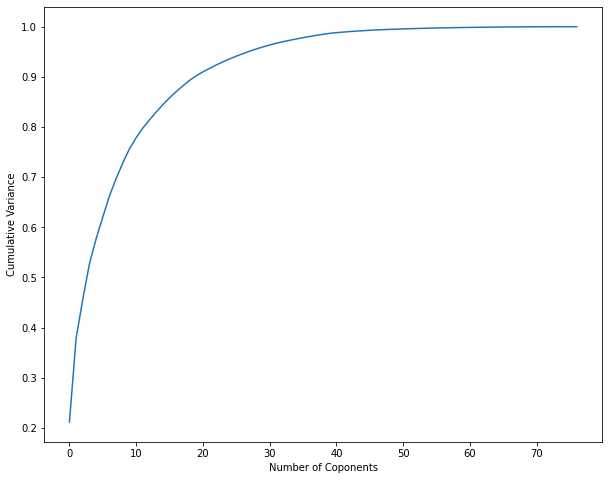

In [171]:
#Plotting the scree plot
%matplotlib inline
fig = plt.figure(figsize = (10,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Coponents')
plt.ylabel('Cumulative Variance')
plt.show()

35 componenets are enough to describe 95% of the variance in the dataset

In [172]:
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=35)

In [173]:
df_train_pca = pca_final.fit_transform(X_train)

#### Correlation Matrix


In [174]:
#creating correlation matrix for the principal components
corrrel_mat = np.corrcoef(df_train_pca.transpose())

In [175]:
#plotting the correlation matrix
# %matplotlib inline
# plt.figure(figsize = (20,20))
# sns.heatmap(corrrel_mat,annot = True)

In [176]:
#Applying selected components to the test data - 40 components
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(9004, 35)

### 1. Logistic Regression with PCA

In [177]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

lr_pca = LogisticRegression(class_weight='balanced')

In [178]:
model_lrpca = lr_pca.fit(df_train_pca,y_train)

In [179]:
pred_probs_test = model_lrpca.predict_proba(df_test_pca)[:,1]
"ROC_AUC Score {:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'ROC_AUC Score 0.84'

In [180]:
#Make prediction on the test data
pred_test = model_lrpca.predict_proba(df_test_pca)
y_pred_default = model_lrpca.predict(df_test_pca)

##### Confusion Matrix

In [181]:
# print(confusion_matrix(y_test,y_pred_default))
# print(accuracy_score(y_test,y_pred_default))

confusion = metrics.confusion_matrix(y_test, y_pred_default )
print(confusion)

[[6121 1933]
 [ 213  737]]


In [182]:
# Predicted     not_converted    converted
# Actual
# not_converted       5832      2222
# converted           250       700

#### Accuracy

In [183]:
# Let's check the overall accuracy.
print('Accuracy :',metrics.accuracy_score(y_test, y_pred_default))

Accuracy : 0.7616614837849844


In [184]:
y_pred_df = pd.DataFrame(pred_test)
y_pred_1 = y_pred_df.iloc[:,[1]]
y_pred_1
y_pred_1.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)
y_pred_final = pd.concat([y_test,y_pred_1],axis=1)
y_pred_final= y_pred_final.rename(columns={ 1 : 'Churn_Prob'})
y_pred_final["Churn"] = y_pred_final["Churn"].astype(str).astype(int)
y_pred_final

,Churn,Churn_Prob
0,0,0.915650
1,0,0.889964
2,0,0.269101
3,0,0.053939
4,0,0.134919
...,...,...
8999,0,0.132653
9000,0,0.347363
9001,0,0.424715
9002,0,0.132564


### Plotting the ROC curve

In [185]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [186]:
fpr, tpr, thresholds = metrics.roc_curve( y_pred_final.Churn, y_pred_final.Churn_Prob, drop_intermediate = False )

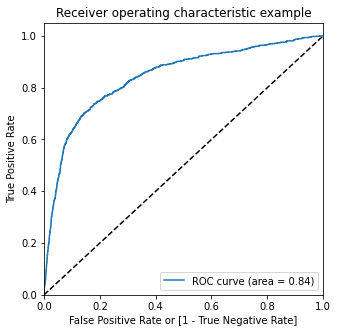

In [187]:
draw_roc(y_pred_final.Churn, y_pred_final.Churn_Prob)

In [188]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.Churn_Prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,Churn,Churn_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.915650,1,1,1,1,1,1,1,1,1,1
1,0,0.889964,1,1,1,1,1,1,1,1,1,0
2,0,0.269101,1,1,1,0,0,0,0,0,0,0
3,0,0.053939,1,0,0,0,0,0,0,0,0,0
4,0,0.134919,1,1,0,0,0,0,0,0,0,0


In [189]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix( y_pred_final.Churn, y_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    sensi = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    speci = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy  sensitivity  specificity
0.0   0.0  0.105509     0.000000     1.000000
0.1   0.1  0.257219     0.173082     0.970526
0.2   0.2  0.398601     0.334989     0.937895
0.3   0.3  0.541537     0.498510     0.906316
0.4   0.4  0.665704     0.643159     0.856842
0.5   0.5  0.761661     0.759995     0.775789
0.6   0.6  0.834296     0.849516     0.705263
0.7   0.7  0.885273     0.920040     0.590526
0.8   0.8  0.899156     0.961510     0.370526
0.9   0.9  0.898712     0.990936     0.116842


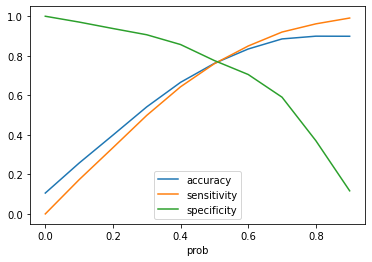

In [190]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specificity'])

In [191]:
#From the curve above, 0.5 is the optimum point to take it as a cutoff probability.

In [192]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)

y_pred_final.head()

,Churn,Churn_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.915650,1,1,1,1,1,1,1,1,1,1,1
1,0,0.889964,1,1,1,1,1,1,1,1,1,0,1
2,0,0.269101,1,1,1,0,0,0,0,0,0,0,0
3,0,0.053939,1,0,0,0,0,0,0,0,0,0,0
4,0,0.134919,1,1,0,0,0,0,0,0,0,0,0


In [193]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Churn, y_pred_final.final_predicted)

0.7616614837849844

In [194]:
confusion2 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted )
confusion2

array([[6121, 1933],
       [ 213,  737]])

In [195]:
 # Metrics beyond accuracy   

TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

#Sensitivity
print('Sensitivity : ',TP / float(TP+FN))

#Specificity
print('Specificity : ', TN / float(TN+FP))

# Calculate false postive rate - predicting churn when customer does not have churned
print('False Positive Rate :' , FP/ float(TN+FP))

# positive predictive value 
print ('Positive Predictive value :',TP / float(TP+FP))

# Negative predictive value
print ('Negative Predictive value',TN / float(TN+ FN))

Sensitivity :  0.7757894736842105
Specificity :  0.7599950335237149
False Positive Rate : 0.24000496647628508
Positive Predictive value : 0.2760299625468165
Negative Predictive value 0.9663719608462267


### 2. Decision Tree Modelling with PCA

In [196]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [197]:
#X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)
clf = DecisionTreeClassifier()
clf = clf.fit(X_train,y_train)
#Predict the response for test dataset
y_pred2 = clf.predict(X_test)
y_pred2

array(['1', '0', '0', ..., '0', '0', '0'], dtype=object)

In [198]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred2))

Accuracy: 0.8701688138605065


In [199]:
#Importing required packages for visualization
from IPython.display import Image  
from io import StringIO
 
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [200]:
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
               filled=True, rounded=True,
               special_characters=True, feature_names = None,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('telecom.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.742393 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.742393 to fit



### 3. Random Forest Modelling with PCA

In [201]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier
#Create a Gaussian Classifier
rclf=RandomForestClassifier(n_estimators=100)
#Train the model using the training sets y_pred=clf.predict(X_test)
rclf.fit(X_train,y_train)
y_pred3=rclf.predict(X_test)

In [202]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred3))

Accuracy: 0.9221457130164371


In [203]:
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, #min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

RandomForestClassifier(n_jobs=1)

In [204]:
import pandas as pd
feature_imp = pd.Series(clf.feature_importances_).sort_values(ascending=False)
feature_imp

66    0.239971
3     0.060314
24    0.034618
72    0.027295
1     0.025882
2     0.020348
76    0.019747
64    0.016289
65    0.016011
4     0.015823
42    0.015338
62    0.014106
8     0.013081
38    0.013057
14    0.012217
31    0.012091
61    0.012011
37    0.011936
5     0.011672
29    0.011655
7     0.011501
55    0.010745
40    0.010595
44    0.010585
19    0.010024
68    0.009881
35    0.009852
33    0.009771
69    0.009578
16    0.009556
71    0.009493
25    0.009139
10    0.008865
49    0.008863
22    0.008851
28    0.008594
48    0.008461
56    0.008214
43    0.008074
58    0.007963
12    0.007920
39    0.007843
41    0.007779
9     0.007673
67    0.007610
23    0.007589
54    0.007520
50    0.007381
26    0.007281
34    0.007252
63    0.006708
51    0.006682
53    0.006509
13    0.006375
27    0.006357
59    0.006326
60    0.005887
32    0.005810
45    0.005657
46    0.005645
47    0.005643
18    0.005628
36    0.005409
21    0.005174
74    0.005018
17    0.004977
52    0.00

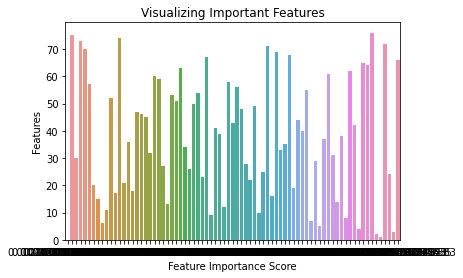

In [205]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

<b> P-Values are smaller than 0.05</b>


##Conclusion:

<b>Accuracy of different models:

    1. Logistic with PCA - 76%

    2. Decision tree - 86%

    3. Random Forest - 92%
    
    

Customer churn seems to be well predicted by drop in usage.

Telecom company should pay close attention to drop in ARPU MOU , Recharge Amout and Data Usage (of both 2G and 3G) month over month. And contact these customers periodically and provide special service schemes to retain the customers
